In [1]:
import tensorflow as tf
from tensorflow.keras.datasets import mnist
import matplotlib.pyplot as plt
import numpy as np
import pickle
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping

In [2]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()

x_train = (x_train / 127.5) - 1
x_test = (x_test / 127.5) - 1

In [3]:
train_patches = x_train[:, 10:20, 10:20].reshape(-1,100)
test_patches = x_test[:, 10:20, 10:20].reshape(-1,100)
x_train = x_train.reshape(-1, 784)
x_test = x_test.reshape(-1,784)
train_dims = np.random.normal(size=(60000, 100))
test_dims = np.random.normal(size=(10000, 100))

train_patches = np.concatenate((train_patches, train_dims), axis=1)
test_patches = np.concatenate((test_patches, test_dims), axis=1)
train_data = np.concatenate((train_patches, test_patches))
real_train = np.concatenate((x_train,x_test))

In [4]:
def create_generator():
    ip = tf.keras.layers.Input((200,))
    x = tf.keras.layers.Dense(300, activation='relu', kernel_initializer="glorot_normal",)(ip)
    x = tf.keras.layers.Dense(400, activation='relu', kernel_initializer="glorot_normal",)(x)
    op = tf.keras.layers.Dense(784, activation='relu', kernel_initializer="glorot_normal",)(x)
    
    generator = tf.keras.models.Model(name='generator', inputs=[ip], outputs=[op])
    return generator

import tensorflow as tf

def create_generator():
    ip = tf.keras.layers.Input((200,))
    
    x = tf.keras.layers.Dense(300, activation='relu', kernel_initializer="glorot_normal",)(ip)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Dense(400, activation='relu', kernel_initializer="glorot_normal")(x)
    x = tf.keras.layers.BatchNormalization()(x) 
    op = tf.keras.layers.Dense(784, activation='tanh', kernel_initializer="glorot_normal")(x)
    
    generator = tf.keras.models.Model(name='generator', inputs=[ip], outputs=[op])
    return generator

generator = create_generator()
generator.summary()


generator = create_generator()
generator.summary()

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 200)]             0         
                                                                 
 dense (Dense)               (None, 300)               60300     
                                                                 
 batch_normalization (Batch  (None, 300)               1200      
 Normalization)                                                  
                                                                 
 dense_1 (Dense)             (None, 400)               120400    
                                                                 
 batch_normalization_1 (Bat  (None, 400)               1600      
 chNormalization)                                                
                                                                 
 dense_2 (Dense)             (None, 784)               31

In [5]:
def create_discriminator():
    ip = tf.keras.layers.Input(shape=(784,))
    x = tf.keras.layers.Flatten()(ip)
    x = tf.keras.layers.Dense(400, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.2)(x)
    x = tf.keras.layers.Dense(200, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.1)(x)
    x = tf.keras.layers.Dense(100, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.1)(x)
    op = tf.keras.layers.Dense(1, activation='sigmoid')(x)

    discriminator = tf.keras.models.Model(name='discriminator', inputs=[ip], outputs=[op])
    return discriminator

discriminator = create_discriminator()
discriminator.compile(loss="binary_crossentropy", optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=0.0001), metrics=["accuracy"])
discriminator.summary()

Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 784)]             0         
                                                                 
 flatten (Flatten)           (None, 784)               0         
                                                                 
 dense_6 (Dense)             (None, 400)               314000    
                                                                 
 dropout (Dropout)           (None, 400)               0         
                                                                 
 dense_7 (Dense)             (None, 200)               80200     
                                                                 
 dropout_1 (Dropout)         (None, 200)               0         
                                                                 
 dense_8 (Dense)             (None, 100)             

In [6]:
def gan(generator, discriminator):
    discriminator.trainable = False
    generator_input = tf.keras.layers.Input(shape=(200,))
    input_patch = generator_input[:, :100]

    generator_output = generator(generator_input)
    reshaped_output = tf.keras.layers.Reshape((28, 28))(generator_output)
    center_patch = reshaped_output[:, 10:20, 10:20]
    flattened_center_patch = tf.keras.layers.Flatten()(center_patch)

    mse_loss = tf.keras.backend.mean(tf.keras.backend.square(flattened_center_patch - input_patch))

    discriminator_output = discriminator(generator_output)

    gan_model = Model(inputs=generator_input, outputs=discriminator_output)
    gan_model.add_loss(8 * mse_loss)
    return gan_model

gan_model = gan(generator, discriminator)
gan_model.compile(loss="binary_crossentropy", optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=0.0005), metrics=["accuracy"])

In [7]:
gan_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 200)]                0         []                            
                                                                                                  
 generator (Functional)      (None, 784)                  497884    ['input_4[0][0]']             
                                                                                                  
 discriminator (Functional)  (None, 1)                    414401    ['generator[0][0]']           
                                                                                                  
 reshape (Reshape)           (None, 28, 28)               0         ['generator[0][0]']           
                                                                                              

In [8]:
test_visualisations = []
for i in range(10):
    test_visualisations.append(test_patches[y_test == i][:10])

Epoch: 0
Epoch: 0, D Loss: 0.4303486943244934, G Loss: 3.3020429611206055
4/4 [==============================] - 0s 803us/step


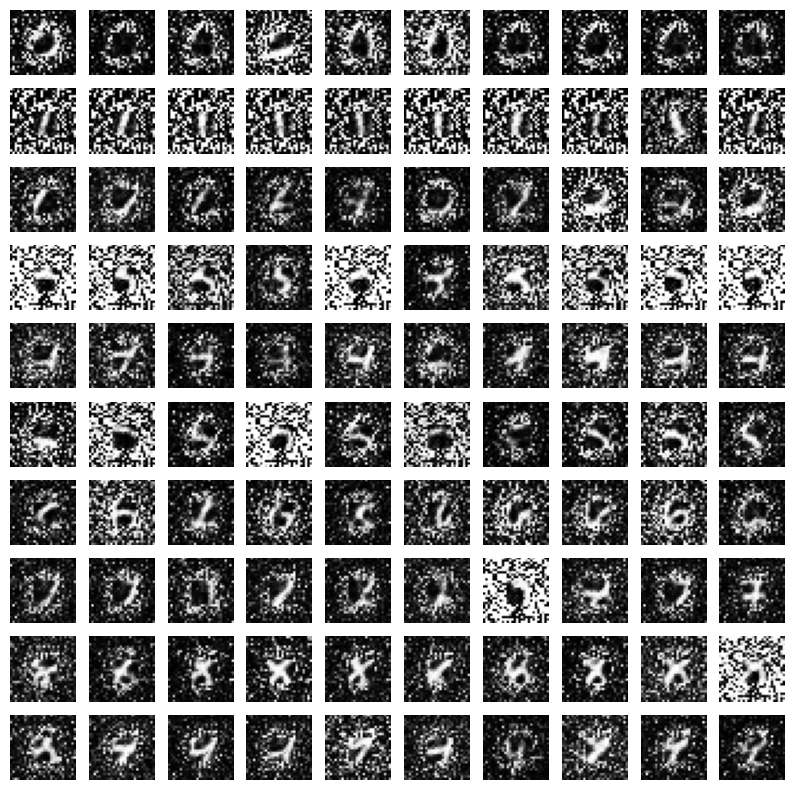

Epoch: 1
Epoch: 2
Epoch: 3
Epoch: 4
Epoch: 5
Epoch: 6
Epoch: 7
Epoch: 8
Epoch: 9
Epoch: 10
Epoch: 10, D Loss: 0.6969308853149414, G Loss: 0.8806342482566833
4/4 [==============================] - 0s 804us/step


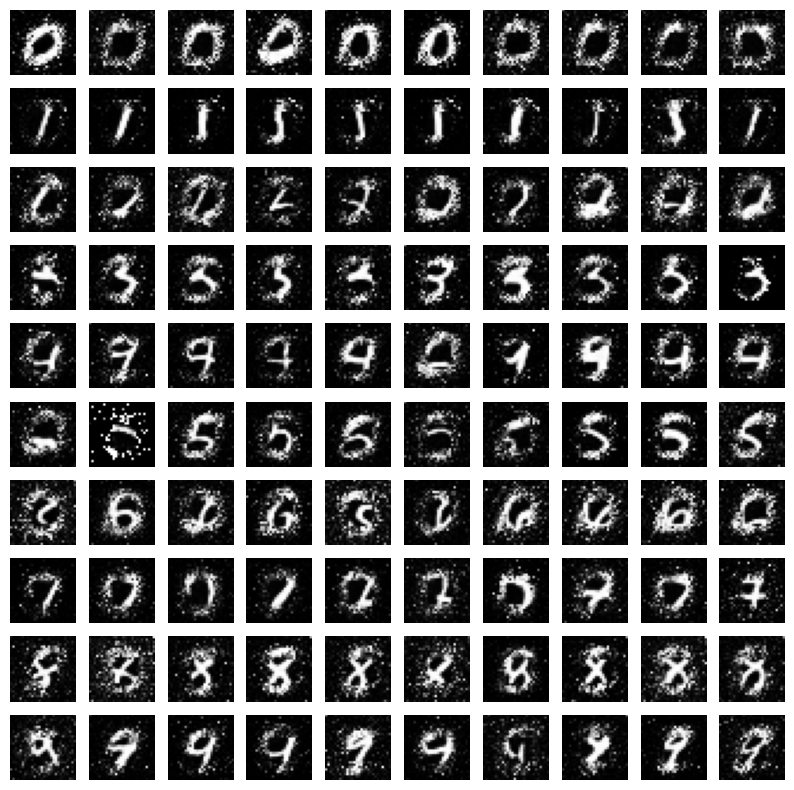

Epoch: 11
Epoch: 12
Epoch: 13
Epoch: 14
Epoch: 15
Epoch: 16
Epoch: 17
Epoch: 18
Epoch: 19
Epoch: 20
Epoch: 20, D Loss: 0.6867499053478241, G Loss: 0.7888641953468323
4/4 [==============================] - 0s 912us/step


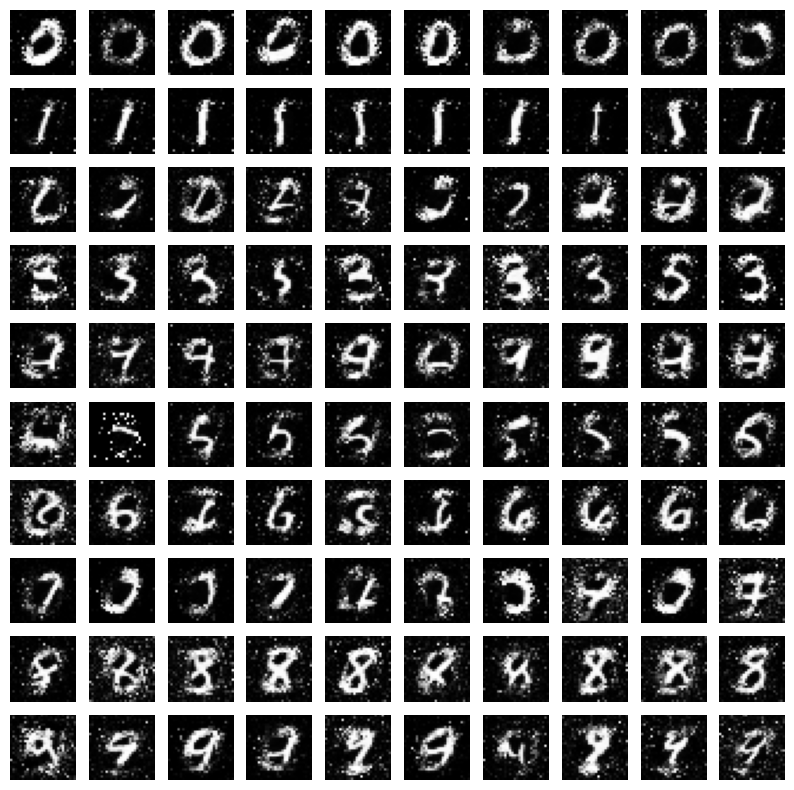

Epoch: 21
Epoch: 22
Epoch: 23
Epoch: 24
Epoch: 25
Epoch: 26
Epoch: 27
Epoch: 28
Epoch: 29
Epoch: 30
Epoch: 30, D Loss: 0.7145444452762604, G Loss: 0.8260923624038696
4/4 [==============================] - 0s 755us/step


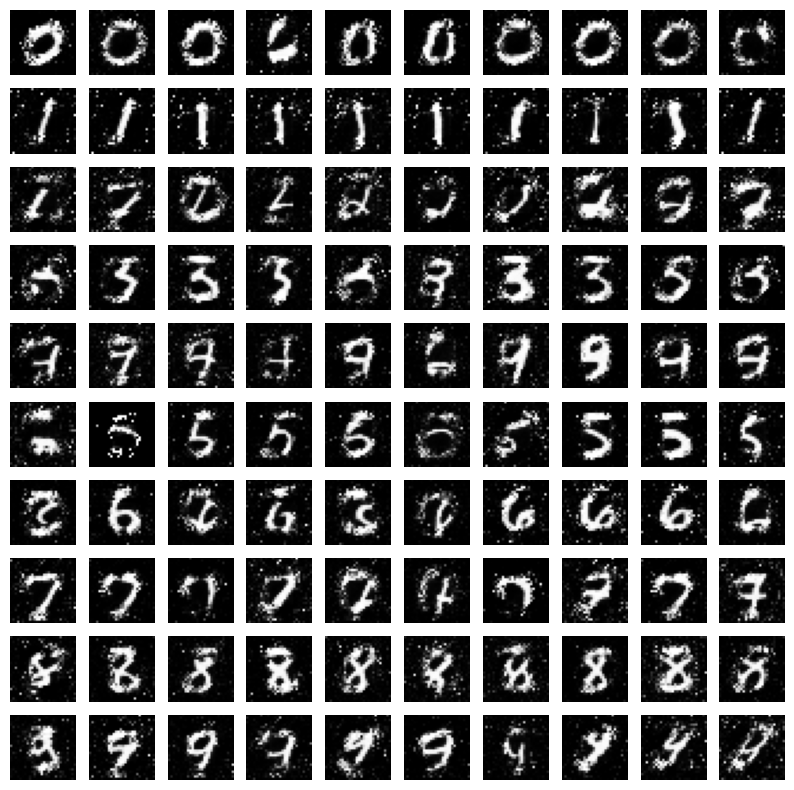

Epoch: 31
Epoch: 32
Epoch: 33
Epoch: 34
Epoch: 35
Epoch: 36
Epoch: 37
Epoch: 38
Epoch: 39
Epoch: 40
Epoch: 40, D Loss: 0.7010803818702698, G Loss: 0.777234673500061
4/4 [==============================] - 0s 830us/step


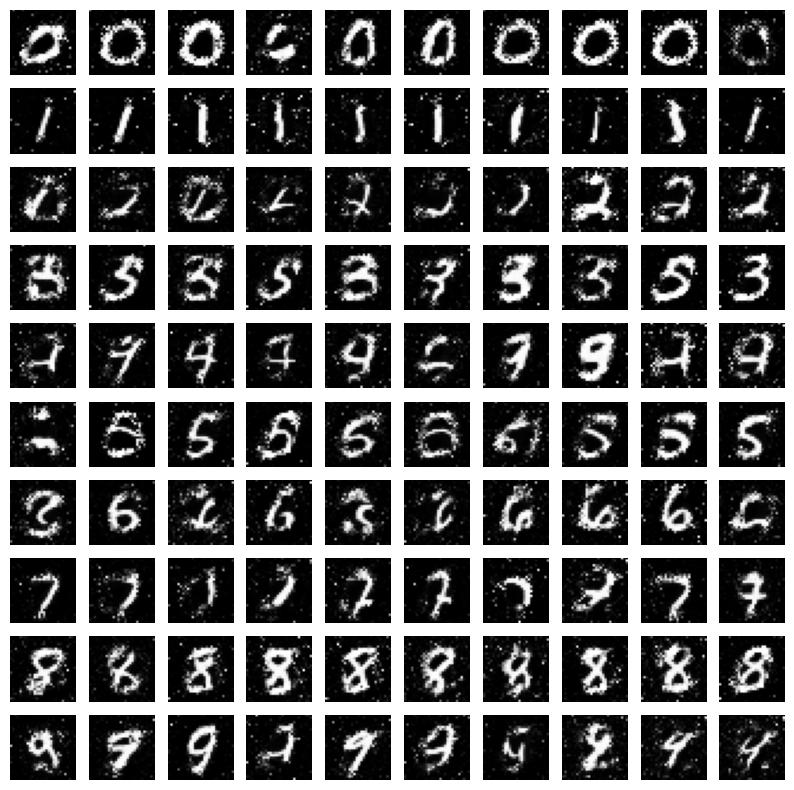

Epoch: 41
Epoch: 42
Epoch: 43
Epoch: 44
Epoch: 45
Epoch: 46
Epoch: 47
Epoch: 48
Epoch: 49
Epoch: 50
Epoch: 50, D Loss: 0.7022316753864288, G Loss: 0.7681204676628113
4/4 [==============================] - 0s 1ms/step


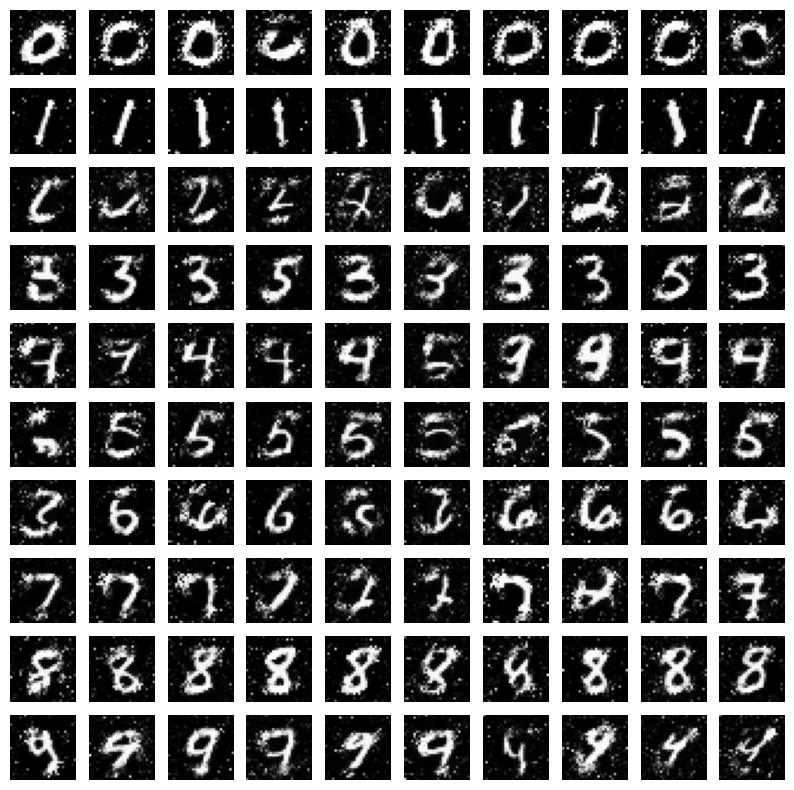

Epoch: 51
Epoch: 52
Epoch: 53
Epoch: 54
Epoch: 55
Epoch: 56
Epoch: 57
Epoch: 58
Epoch: 59
Epoch: 60
Epoch: 60, D Loss: 0.6410070061683655, G Loss: 0.9186285734176636
4/4 [==============================] - 0s 947us/step


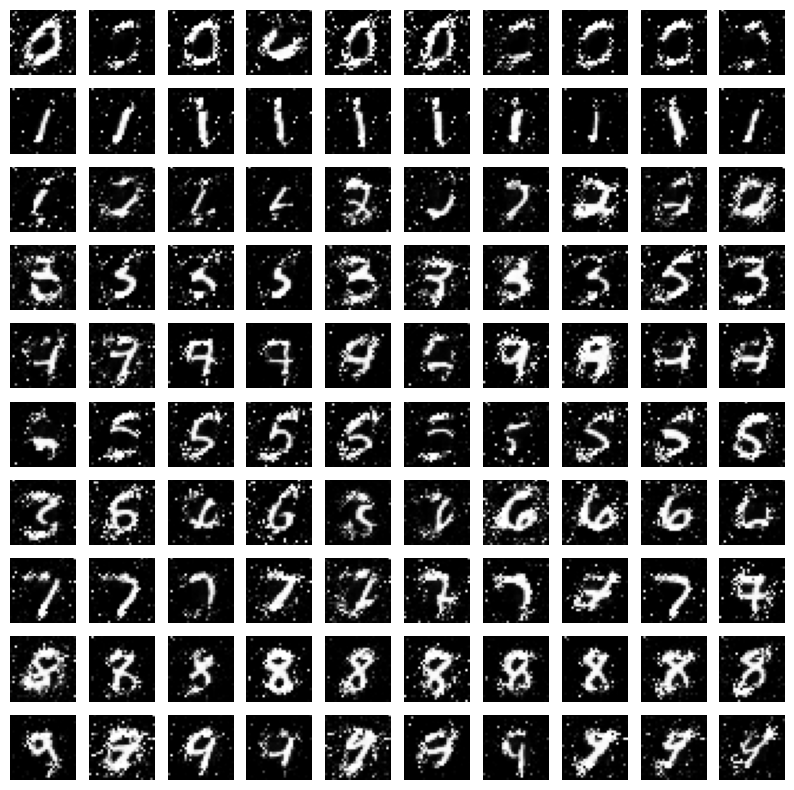

Epoch: 61
Epoch: 62
Epoch: 63
Epoch: 64
Epoch: 65
Epoch: 66
Epoch: 67
Epoch: 68
Epoch: 69
Epoch: 70
Epoch: 70, D Loss: 0.6932928264141083, G Loss: 0.7451847195625305
4/4 [==============================] - 0s 1ms/step


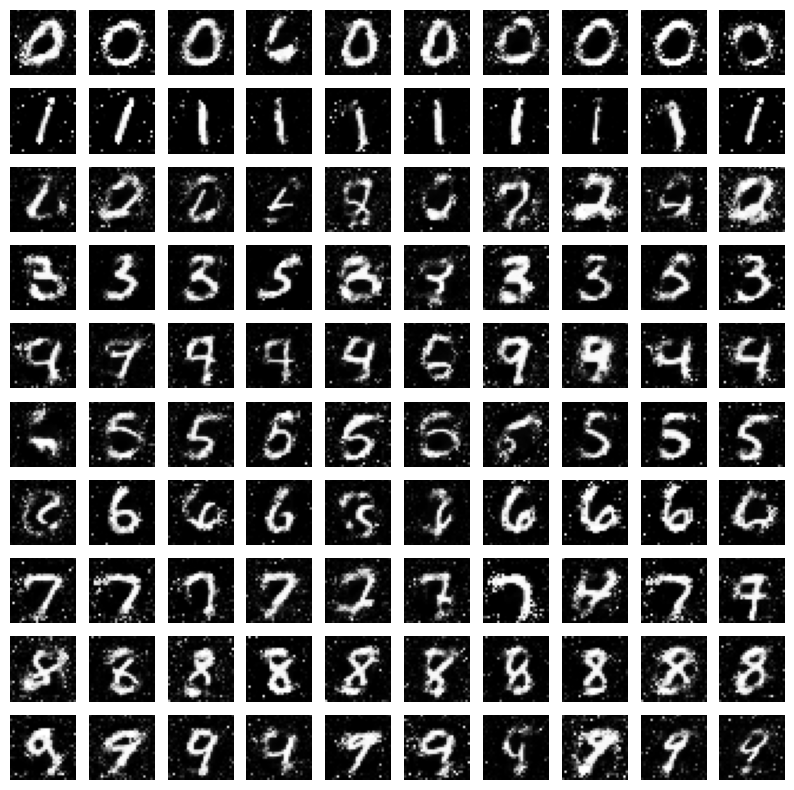

Epoch: 71
Epoch: 72
Epoch: 73
Epoch: 74
Epoch: 75
Epoch: 76
Epoch: 77
Epoch: 78
Epoch: 79
Epoch: 80
Epoch: 80, D Loss: 0.6547641456127167, G Loss: 0.8237500190734863
4/4 [==============================] - 0s 933us/step


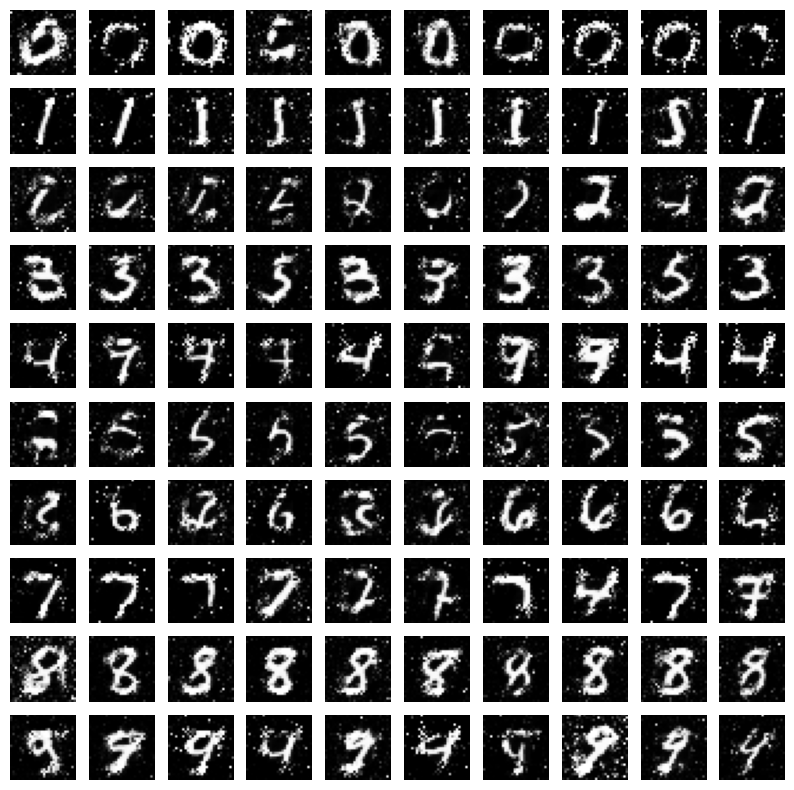

Epoch: 81
Epoch: 82
Epoch: 83
Epoch: 84
Epoch: 85
Epoch: 86
Epoch: 87
Epoch: 88
Epoch: 89
Epoch: 90
Epoch: 90, D Loss: 0.6939873993396759, G Loss: 0.7913916707038879
4/4 [==============================] - 0s 734us/step


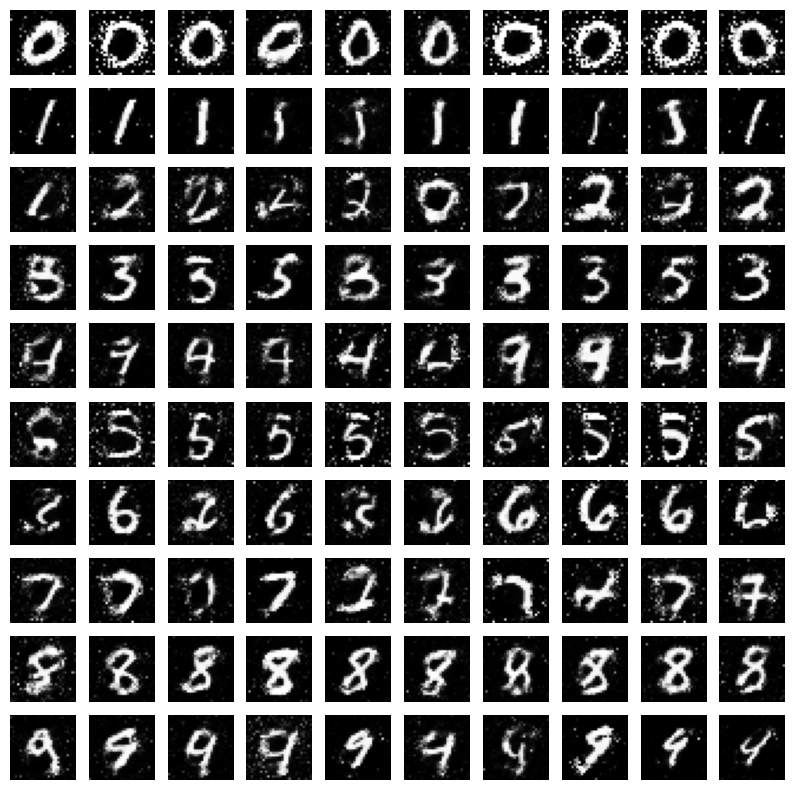

Epoch: 91
Epoch: 92
Epoch: 93
Epoch: 94
Epoch: 95
Epoch: 96
Epoch: 97
Epoch: 98
Epoch: 99
Epoch: 100
Epoch: 100, D Loss: 0.6796056926250458, G Loss: 0.8234572410583496
4/4 [==============================] - 0s 825us/step


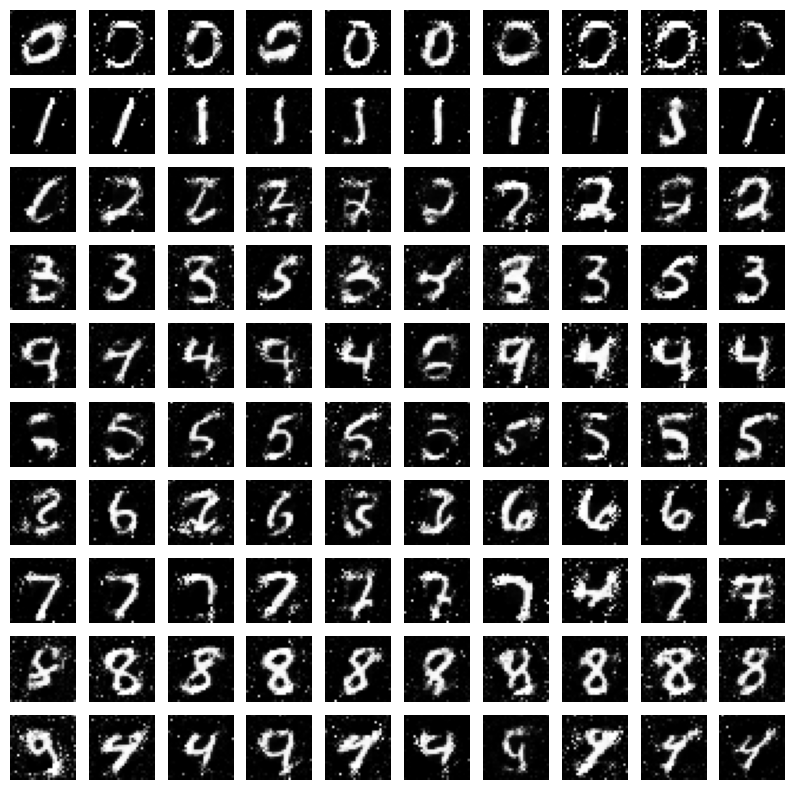

Epoch: 101
Epoch: 102
Epoch: 103
Epoch: 104
Epoch: 105
Epoch: 106
Epoch: 107
Epoch: 108
Epoch: 109
Epoch: 110
Epoch: 110, D Loss: 0.6949433386325836, G Loss: 0.779400110244751
4/4 [==============================] - 0s 703us/step


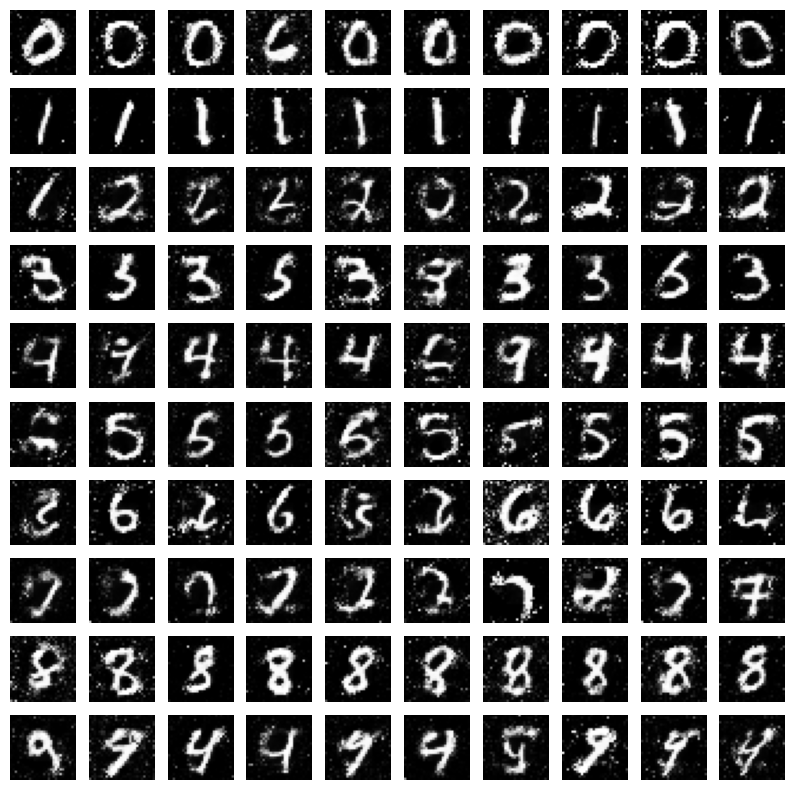

Epoch: 111
Epoch: 112
Epoch: 113
Epoch: 114
Epoch: 115
Epoch: 116
Epoch: 117
Epoch: 118
Epoch: 119
Epoch: 120
Epoch: 120, D Loss: 0.6777957081794739, G Loss: 0.7754419445991516
4/4 [==============================] - 0s 718us/step


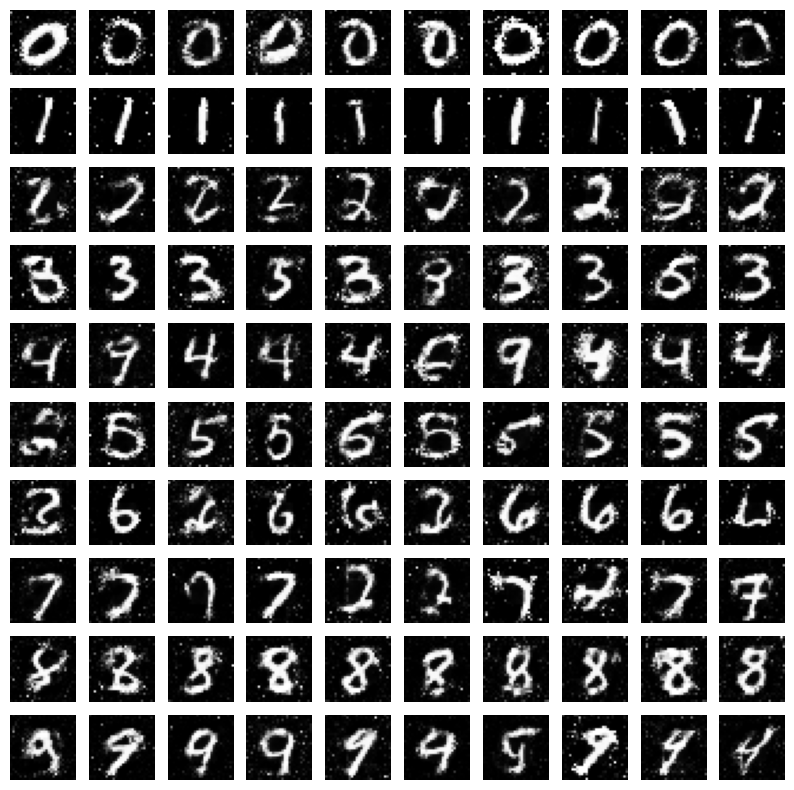

Epoch: 121
Epoch: 122
Epoch: 123
Epoch: 124
Epoch: 125
Epoch: 126
Epoch: 127
Epoch: 128
Epoch: 129
Epoch: 130
Epoch: 130, D Loss: 0.6834037005901337, G Loss: 0.7636848092079163
4/4 [==============================] - 0s 696us/step


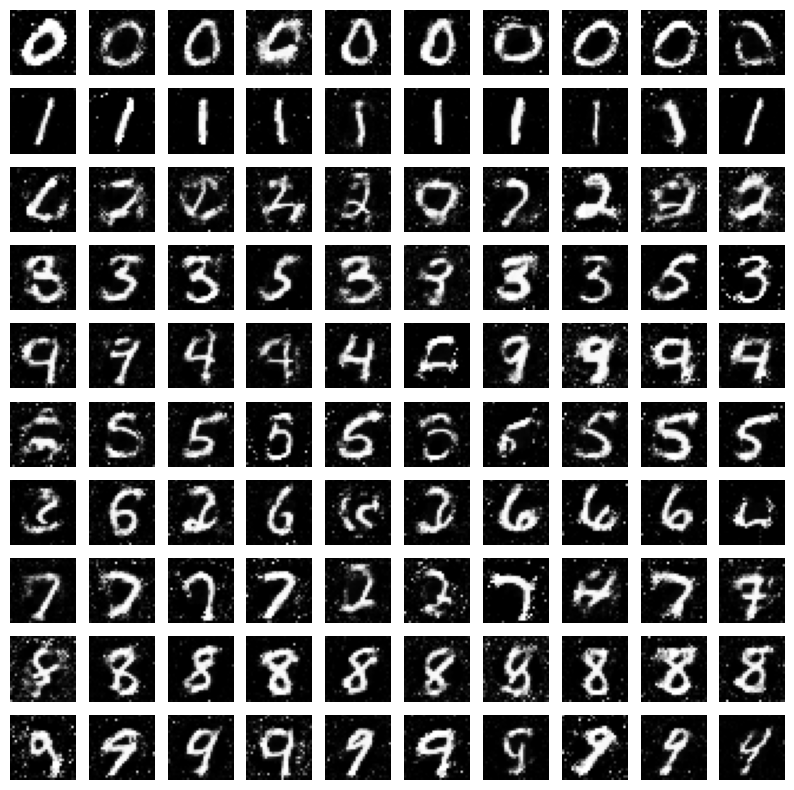

Epoch: 131
Epoch: 132
Epoch: 133
Epoch: 134
Epoch: 135
Epoch: 136
Epoch: 137
Epoch: 138
Epoch: 139
Epoch: 140
Epoch: 140, D Loss: 0.6759702861309052, G Loss: 0.8014860153198242
4/4 [==============================] - 0s 718us/step


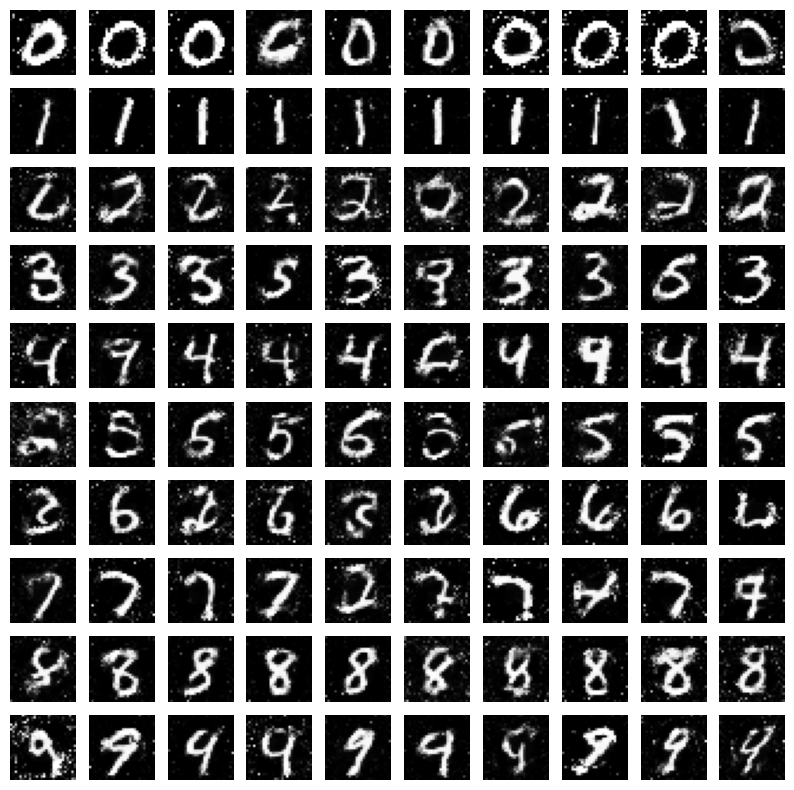

Epoch: 141
Epoch: 142
Epoch: 143
Epoch: 144
Epoch: 145
Epoch: 146
Epoch: 147
Epoch: 148
Epoch: 149
Epoch: 150
Epoch: 150, D Loss: 0.6809086501598358, G Loss: 0.8068825602531433
4/4 [==============================] - 0s 712us/step


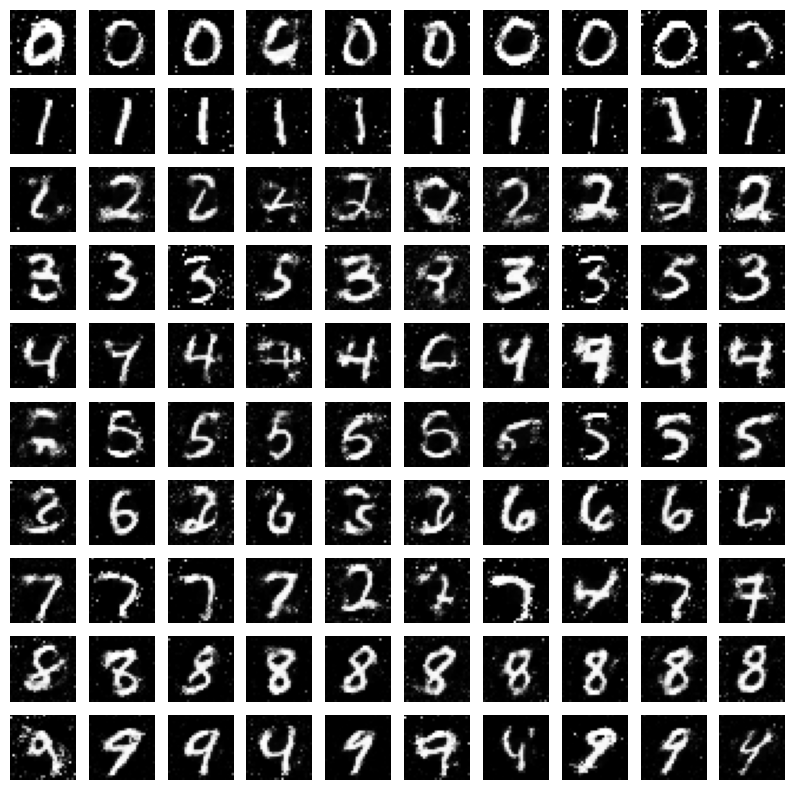

Epoch: 151
Epoch: 152
Epoch: 153
Epoch: 154
Epoch: 155
Epoch: 156
Epoch: 157
Epoch: 158
Epoch: 159
Epoch: 160
Epoch: 160, D Loss: 0.6286444365978241, G Loss: 0.8432899117469788
4/4 [==============================] - 0s 894us/step


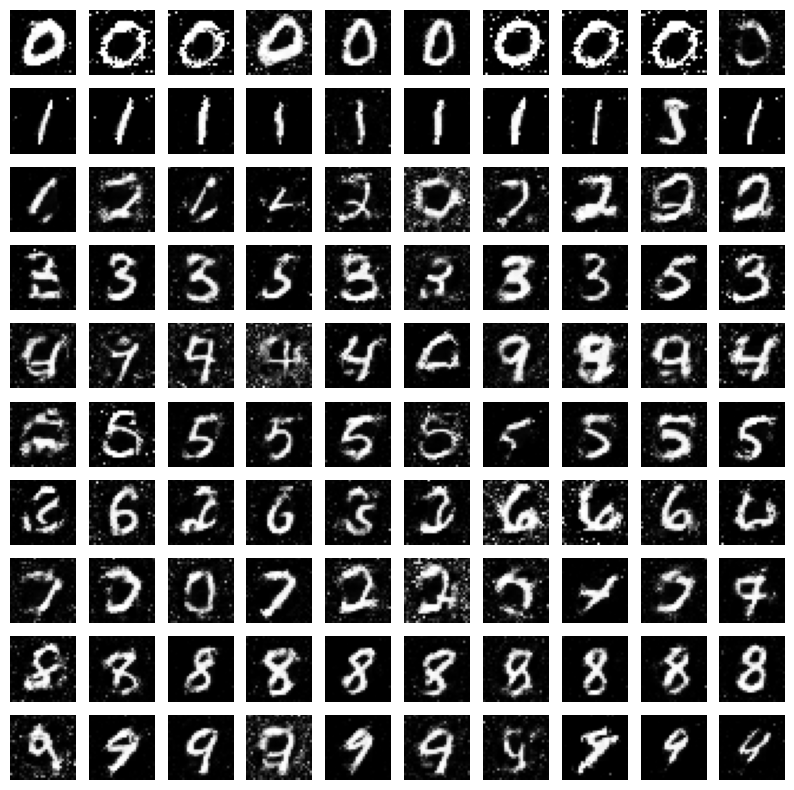

Epoch: 161
Epoch: 162
Epoch: 163
Epoch: 164
Epoch: 165
Epoch: 166
Epoch: 167
Epoch: 168
Epoch: 169
Epoch: 170
Epoch: 170, D Loss: 0.6673720180988312, G Loss: 0.7946465015411377
4/4 [==============================] - 0s 791us/step


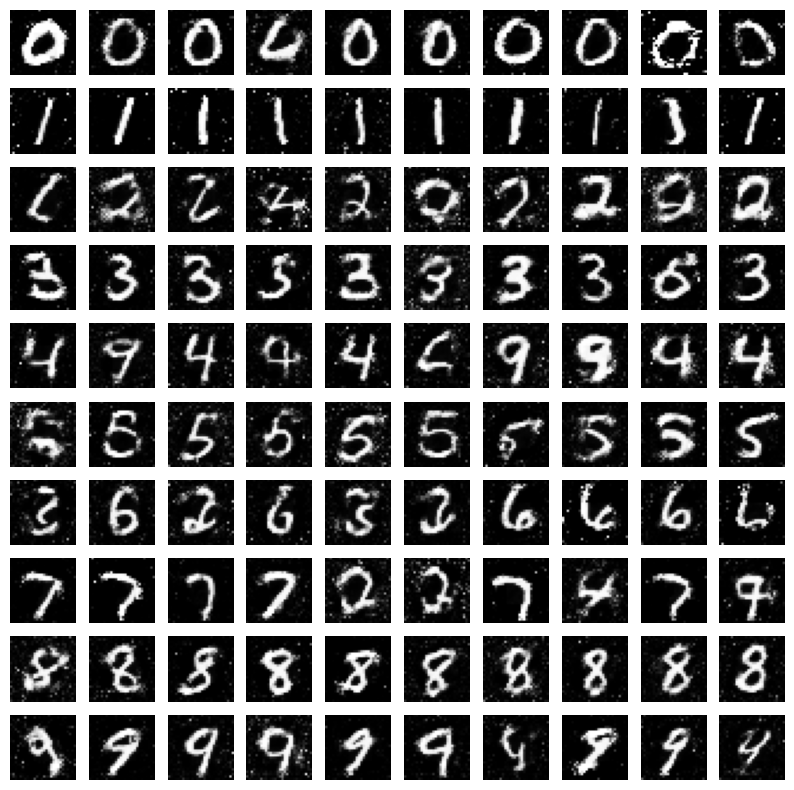

Epoch: 171
Epoch: 172
Epoch: 173
Epoch: 174
Epoch: 175
Epoch: 176
Epoch: 177
Epoch: 178
Epoch: 179
Epoch: 180
Epoch: 180, D Loss: 0.6716184914112091, G Loss: 0.8274402618408203
4/4 [==============================] - 0s 840us/step


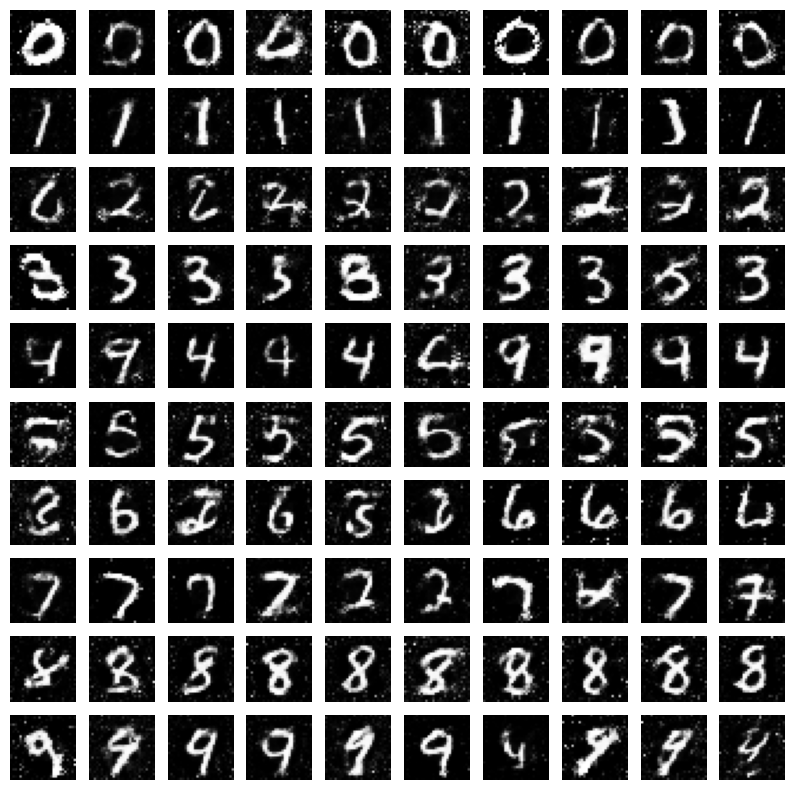

Epoch: 181
Epoch: 182
Epoch: 183
Epoch: 184
Epoch: 185
Epoch: 186
Epoch: 187
Epoch: 188
Epoch: 189
Epoch: 190
Epoch: 190, D Loss: 0.6974459886550903, G Loss: 0.8144750595092773
4/4 [==============================] - 0s 821us/step


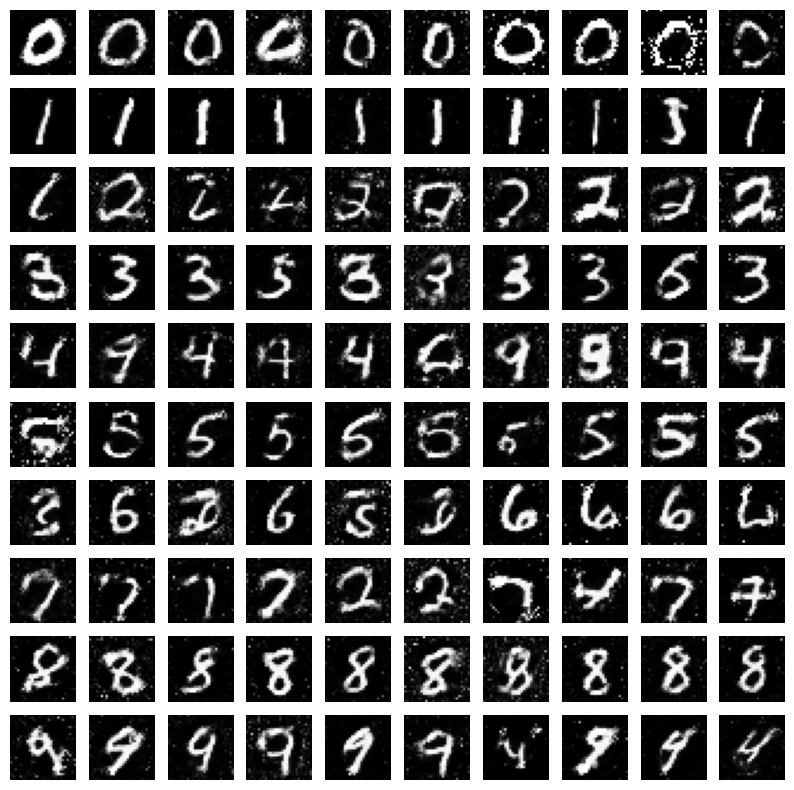

Epoch: 191
Epoch: 192
Epoch: 193
Epoch: 194
Epoch: 195
Epoch: 196
Epoch: 197
Epoch: 198
Epoch: 199
Epoch: 200
Epoch: 200, D Loss: 0.688785195350647, G Loss: 0.7986754179000854
4/4 [==============================] - 0s 985us/step


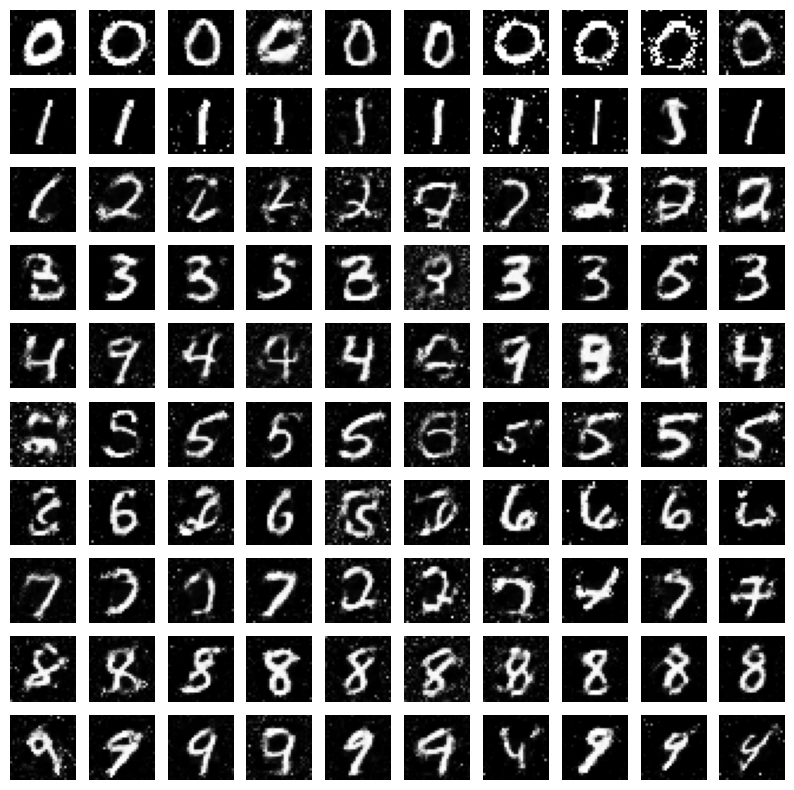

Epoch: 201
Epoch: 202
Epoch: 203
Epoch: 204
Epoch: 205
Epoch: 206
Epoch: 207
Epoch: 208
Epoch: 209
Epoch: 210
Epoch: 210, D Loss: 0.6604689955711365, G Loss: 0.8821514844894409
4/4 [==============================] - 0s 783us/step


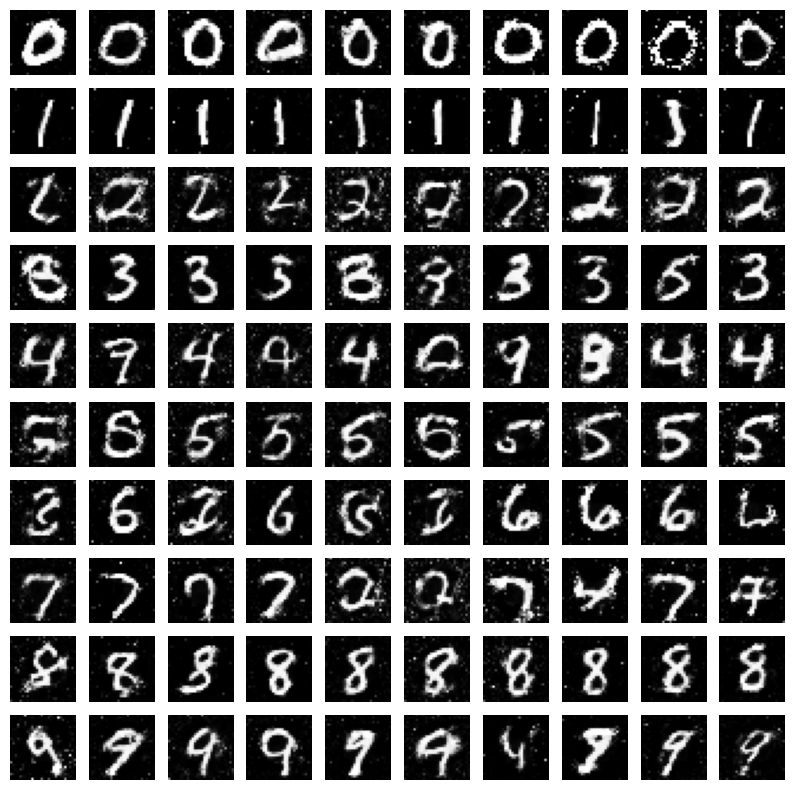

Epoch: 211
Epoch: 212
Epoch: 213
Epoch: 214
Epoch: 215
Epoch: 216
Epoch: 217
Epoch: 218
Epoch: 219
Epoch: 220
Epoch: 220, D Loss: 0.6786367893218994, G Loss: 0.857731819152832
4/4 [==============================] - 0s 682us/step


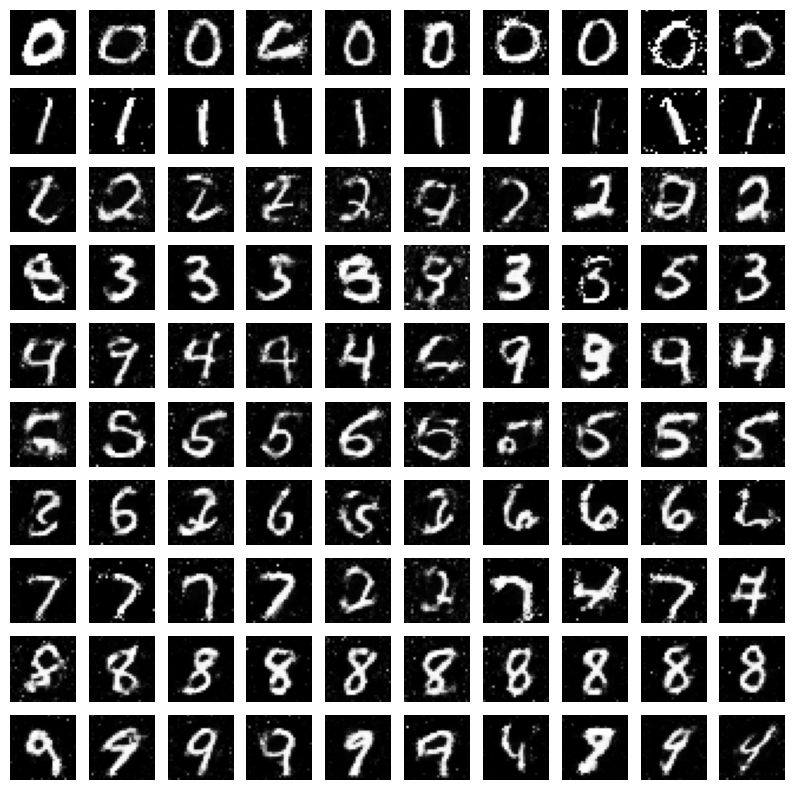

Epoch: 221
Epoch: 222
Epoch: 223
Epoch: 224
Epoch: 225
Epoch: 226
Epoch: 227
Epoch: 228
Epoch: 229
Epoch: 230
Epoch: 230, D Loss: 0.6537685394287109, G Loss: 0.7851335406303406
4/4 [==============================] - 0s 837us/step


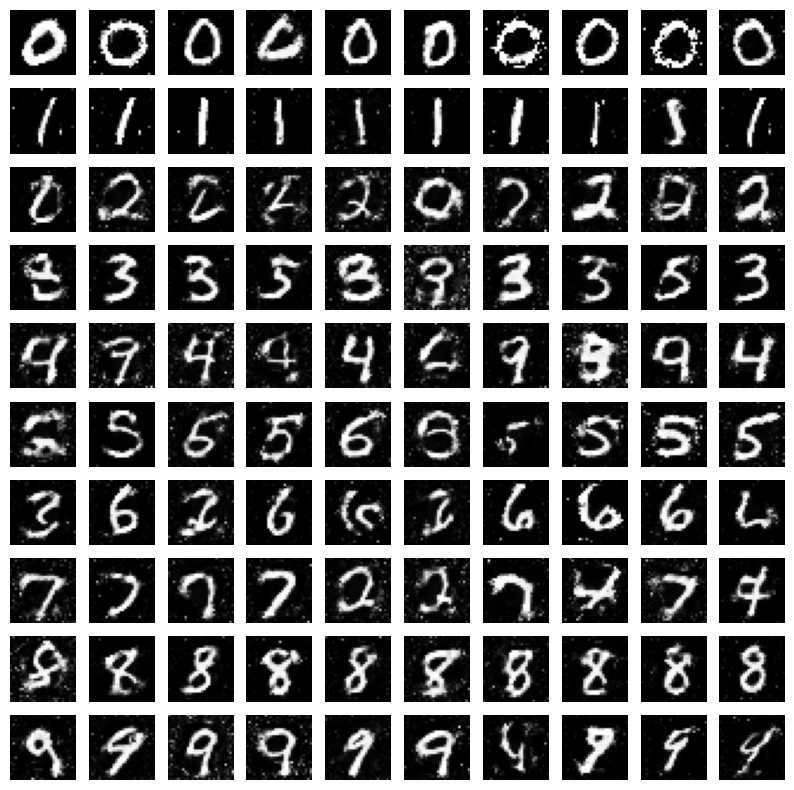

Epoch: 231
Epoch: 232
Epoch: 233
Epoch: 234
Epoch: 235
Epoch: 236
Epoch: 237
Epoch: 238
Epoch: 239
Epoch: 240
Epoch: 240, D Loss: 0.6431992650032043, G Loss: 0.9079266786575317
4/4 [==============================] - 0s 830us/step


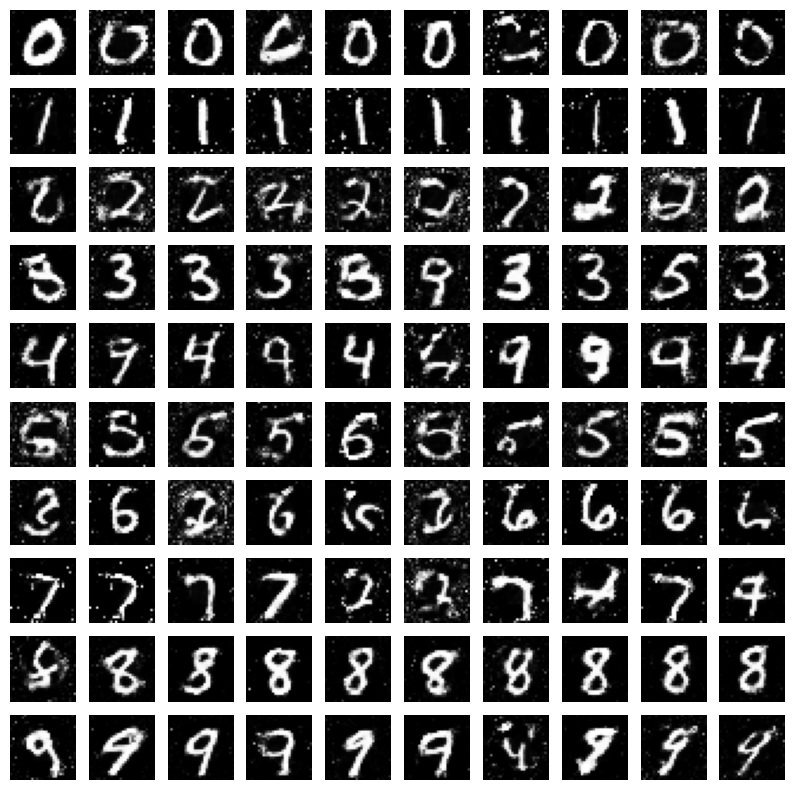

Epoch: 241
Epoch: 242
Epoch: 243
Epoch: 244
Epoch: 245
Epoch: 246
Epoch: 247
Epoch: 248
Epoch: 249


In [10]:
num_epochs = 250
batch_size = 500
save_interval = 10
num_batches = int(train_data.shape[0] / batch_size)

real_labels = np.zeros((batch_size, 1))
fake_labels = np.ones((batch_size, 1))

training_losses = {"Generator": [], "Discriminator": []}
real_accuracy_list = []
fake_accuracy_list = []

for epoch in range(num_epochs):
    print(f"Epoch {epoch + 1}/{num_epochs}")
    for batch_idx in range(num_batches):
        batch_start = batch_idx * batch_size
        batch_end = min((batch_idx + 1) * batch_size, train_data.shape[0])
        real_images = real_train[batch_start:batch_end]
        generated_images = generator.predict(train_data[batch_start:batch_end], verbose=False)
        d_loss_real, real_acc = discriminator.train_on_batch(real_images, real_labels)
        d_loss_fake, fake_acc = discriminator.train_on_batch(generated_images, fake_labels)
        d_loss = (d_loss_real + d_loss_fake) / 2
        g_loss = gan_model.train_on_batch(train_data[batch_start:batch_end], real_labels)

    training_losses["Generator"].append(g_loss)
    training_losses["Discriminator"].append(d_loss)
    real_accuracy_list.append(real_acc)
    fake_accuracy_list.append(1 - fake_acc)

    if epoch % save_interval == 0:
        print(f"Epoch {epoch}, D Loss: {d_loss}, G Loss: {g_loss[0]}")
        z = np.array(test_visualisations).reshape(100, 200)
        generated_images = generator.predict(z)
        
        plt.figure(figsize=(10, 10))
        for i in range(10):
            for j in range(10):
                plt.subplot(10, 10, i * 10 + j + 1)
                plt.imshow(generated_images[i * 10 + j].reshape(28, 28), cmap="gray")
                plt.axis("off")
        plt.show()

Final Test Visualisations

4/4 [==============================] - 0s 1ms/step


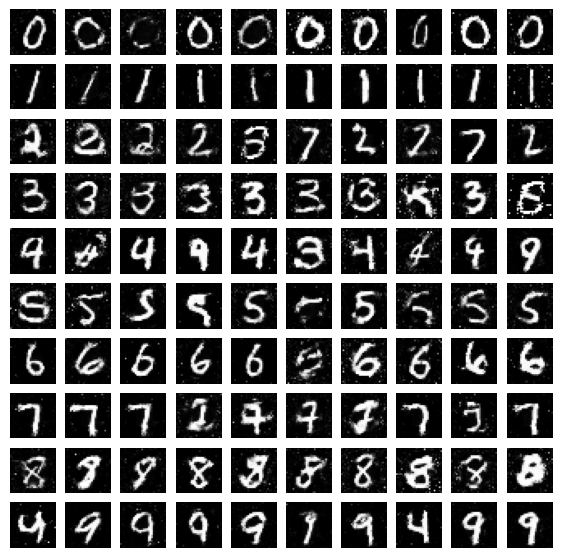

In [13]:
test_visualisations = []
for i in range(10):
    test_visualisations.append(test_patches[y_test == i][30:40])

z = np.array(test_visualisations).reshape(100, 200)
generated_images = generator.predict(z)
plt.figure(figsize=(7, 7))
for i in range(10):
    for j in range(10):
        plt.subplot(10, 10, i * 10 + j + 1)
        plt.imshow(generated_images[i * 10 + j].reshape(28, 28), cmap="gray")
        plt.axis("off")
plt.show()